In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import pickle
from gnomad_db.database import gnomAD_DB
from pathlib import Path
from collections import Counter, defaultdict
from concurrent.futures import ThreadPoolExecutor
import tqdm
#from multiprocessing import Poolml4


In [2]:
import torch 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)


cuda


In [3]:
data_location = '/s/project/benchmark-lm/ssd-cache'
fasta = Path("/s/project/ml4rg_students/2025/project07/data/GRCh38.primary_assembly.genome.fa")
seqs = pd.read_csv("/s/project/ml4rg_students/2025/project07/group_2/data/seqs_2009.csv")

In [4]:
seqs

,Chromosome,Start,End,seq,seq_len
0,chr1,63561,65570,TCATATCGATGGGCACCTTCTTTTTCTTAATTGTATCATACATTTT...,2009
1,chr1,922428,924437,GGGAGAAGACACAGACTTCAGGAGAGGAAGGCACAGGAACTCACTG...,2009
2,chr1,923938,925947,AAGTCCCCGCCGGGCGGGCGCGCGCCAGTGGACGCGGGTGCACGAC...,2009
3,chr1,958690,960699,AGATCGGGAAGAGATTTTTGCACAACTCACCAACATACGCTCCCTG...,2009
4,chr1,964528,966537,AGGTCCGCAGTGGGGCTGCGGGGAGGGGGGCGCGGGTCCGCAGTGG...,2009
...,...,...,...,...,...
30055,chr22,50577909,50579918,CGCCATCCTGGGGGTTGGTCGGCACCTAGGACGGGGGCAGATGGGT...,2009
30056,chr22,50582775,50584784,CGCCATGGCGCGGGCTCGACCGGGCCCCAGGCCAGGCTGCGCTCCG...,2009
30057,chr22,50627773,50629782,GGACATGGGACCGAGGGGTCTGTCCCAAGAGAGGGAGGGCTACTTG...,2009
30058,chr22,50627366,50629375,GCCCATCCGAACCGGGAGCCGGCCGGTCAGGAGGGCGGCCCTGCGG...,2009


In [5]:
row = seqs.iloc[0]
row

Chromosome                                                 chr1
Start                                                     63561
End                                                       65570
seq           TCATATCGATGGGCACCTTCTTTTTCTTAATTGTATCATACATTTT...
seq_len                                                    2009
Name: 0, dtype: object

In [8]:
db = gnomAD_DB(data_location, gnomad_version="v4")

In [9]:
def prep(chrom, start, end):

    if isinstance(chrom, str) and chrom.lower().startswith("chr"):
        chrom = chrom[3:]
    
    db_region = db.get_info_for_interval(chrom=chrom, interval_start=start, interval_end = end, query="*")
    db_region = db_region[db_region['filter'] == 'PASS'] 

    interval_length = end - start
    db_region['len_ref'] = db_region['ref'].apply(len)
    db_region['len_alt'] = db_region['alt'].apply(len)  
    db_region['is_snv'] = (db_region['len_ref'] == 1) & (db_region['len_alt'] == 1)

    db_region = db_region[db_region['is_snv']]

    return db_region

In [15]:
gnomad_df = db.get_info_for_interval(chrom=1, interval_start=row.Start, interval_end = row.End, query="*")
gnomad_df

,chrom,pos,ref,alt,filter,AC,AN,AF,MQ,QD,...,VarDP,AS_VQSLOD,AC_grpmax,AN_grpmax,AF_grpmax,AF_eas,AF_nfe,AF_fin,AF_afr,AF_asj
0,1,63565,T,C,AC0;AS_VQSR,0.0,111006.0,0.000000,29.5456,4.55556,...,36.0,-2.8474,NaN,NaN,NaN,0.0,0.000000,0.0,0.000000,0.0
1,1,63568,C,A,PASS,4.0,111332.0,0.000036,33.151,6.01449,...,345.0,-2.2063,4.0,35050.0,0.000114,0.0,0.000000,0.0,0.000114,0.0
2,1,63568,C,T,AC0,0.0,111330.0,0.000000,33.151,6.01449,...,345.0,-2.2482,NaN,NaN,NaN,0.0,0.000000,0.0,0.000000,0.0
3,1,63569,G,A,AS_VQSR,1.0,111480.0,0.000009,32.7067,13.50880,...,171.0,-2.9767,1.0,35076.0,0.000029,0.0,0.000000,0.0,0.000029,0.0
4,1,63571,T,C,PASS,1.0,112580.0,0.000009,32.3505,9.91071,...,56.0,-2.4258,1.0,47852.0,0.000021,0.0,0.000021,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
679,1,65530,T,G,AC0;AS_VQSR,0.0,1226.0,0.000000,27.0,76.00000,...,1.0,-5.3043,NaN,NaN,NaN,0.0,0.000000,0.0,0.000000,0.0
680,1,65544,T,G,AC0;AS_VQSR,0.0,1534.0,0.000000,30.4959,8.25000,...,12.0,-2.6783,NaN,NaN,NaN,0.0,0.000000,0.0,0.000000,0.0
681,1,65549,G,T,AC0;AS_VQSR,0.0,1740.0,0.000000,30.3736,14.87500,...,8.0,-3.7294,NaN,NaN,NaN,0.0,0.000000,0.0,0.000000,0.0
682,1,65552,G,A,AS_VQSR,5.0,1746.0,0.002864,29.0939,10.99340,...,3160.0,-3.7167,1.0,84.0,0.011905,0.0,0.006024,0.0,0.002309,0.0


In [ ]:
group_list = list(gnomad_df.groupby('pos'))
_, group1 = group_list[1]
group1

,chrom,pos,ref,alt,filter,AC,AN,AF,MQ,QD,...,VarDP,AS_VQSLOD,AC_grpmax,AN_grpmax,AF_grpmax,AF_eas,AF_nfe,AF_fin,AF_afr,AF_asj
1,1,63568,C,A,PASS,4.0,111332.0,0.000036,33.151,6.01449,...,345.0,-2.2063,4.0,35050.0,0.000114,0.0,0.0,0.0,0.000114,0.0
2,1,63568,C,T,AC0,0.0,111330.0,0.000000,33.151,6.01449,...,345.0,-2.2482,NaN,NaN,NaN,0.0,0.0,0.0,0.000000,0.0


In [1]:
print(type(group1))

NameError: name 'group1' is not defined

In [20]:
filtered_df = prep(row.Chromosome, row.Start, row.End)

In [ ]:
for pos_value, group in filtered_df.groupby('pos'):
    print(group)

In [7]:
def extract_kmers(seq, k=7):
    return [seq[i:i+k] for i in range(len(seq) - k + 1)]

def process_row(row):
    region = prep(chrom=row.Chromosome, start=row.Start, end=row.End)
    region['zero_pos'] = region['pos'] - row.Start - 1
    
    all_kmers = extract_kmers(row.seq, k=7)
    total_kmer_counts = Counter(all_kmers)

    variation_kmer_counts = Counter()
    variation_kmer_alleles = defaultdict(list)

    valid = region[(region['zero_pos'] >= 3) & (region['zero_pos'] <= len(row.seq) - 4)]
    
    #for zero_pos in valid['zero_pos']:
    #    kmer = row.seq[zero_pos - 3 : zero_pos + 4]
    #    variation_kmer_counts[kmer] += 1
    #    variation_kmer_alleles[kmer].append((var['ref'], var['alt']))
    for _, var in valid.iterrows():
        zero_pos = var['zero_pos']
        kmer = row.seq[zero_pos - 3 : zero_pos + 4]
        variation_kmer_counts[kmer] += 1
        variation_kmer_alleles[kmer].append((var['ref'], var['alt']))

    print('allele')    

    return total_kmer_counts, variation_kmer_counts, variation_kmer_alleles

In [27]:
#this 
def extract_kmers(seq, k=7):
    return [seq[i:i+k] for i in range(len(seq) - k + 1)]

def process_row(row):
    region = prep(chrom=row.Chromosome, start=row.Start, end=row.End)
    region['zero_pos'] = region['pos'] - row.Start - 1

    all_kmers = extract_kmers(row.seq, k=7)
    var_kmers = []

    valid = region[(region['zero_pos'] >= 3) & (region['zero_pos'] <= len(row.seq) - 4)]

    for _, var in valid.iterrows():
        zero_pos = var['zero_pos']
        print(zero_pos)
        kmer = row.seq[zero_pos - 3 : zero_pos + 4]
        print(kmer)
        var_kmers.append(f"{kmer}_{var['alt']}")  # ← key line that adds alt to the string
        print(var_kmers)


    return all_kmers, var_kmers


In [28]:
row = seqs.iloc[0]
a, v = process_row(row)

6
TATCGAT
['TATCGAT_A']
9
CGATGGG
['TATCGAT_A', 'CGATGGG_C']
10
GATGGGC
['TATCGAT_A', 'CGATGGG_C', 'GATGGGC_A']
66
AACGACA
['TATCGAT_A', 'CGATGGG_C', 'GATGGGC_A', 'AACGACA_A']
70
ACATTCC
['TATCGAT_A', 'CGATGGG_C', 'GATGGGC_A', 'AACGACA_A', 'ACATTCC_A']
72
ATTCCTC
['TATCGAT_A', 'CGATGGG_C', 'GATGGGC_A', 'AACGACA_A', 'ACATTCC_A', 'ATTCCTC_A']
105
CTTCGTC
['TATCGAT_A', 'CGATGGG_C', 'GATGGGC_A', 'AACGACA_A', 'ACATTCC_A', 'ATTCCTC_A', 'CTTCGTC_T']
106
TTCGTCG
['TATCGAT_A', 'CGATGGG_C', 'GATGGGC_A', 'AACGACA_A', 'ACATTCC_A', 'ATTCCTC_A', 'CTTCGTC_T', 'TTCGTCG_A']
109
GTCGGCT
['TATCGAT_A', 'CGATGGG_C', 'GATGGGC_A', 'AACGACA_A', 'ACATTCC_A', 'ATTCCTC_A', 'CTTCGTC_T', 'TTCGTCG_A', 'GTCGGCT_A']
116
CACATCA
['TATCGAT_A', 'CGATGGG_C', 'GATGGGC_A', 'AACGACA_A', 'ACATTCC_A', 'ATTCCTC_A', 'CTTCGTC_T', 'TTCGTCG_A', 'GTCGGCT_A', 'CACATCA_G']
118
CATCACC
['TATCGAT_A', 'CGATGGG_C', 'GATGGGC_A', 'AACGACA_A', 'ACATTCC_A', 'ATTCCTC_A', 'CTTCGTC_T', 'TTCGTCG_A', 'GTCGGCT_A', 'CACATCA_G', 'CATCACC_T']
120
TCA

In [ ]:
import pickle

output_file = "partial_results.pkl"

# If you want to resume, load existing results
try:
    with open(output_file, "rb") as f:
        results = pickle.load(f)
        start_idx = len(results)
        print(f"Resuming from row {start_idx}")
except (FileNotFoundError, EOFError):
    results = []
    start_idx = 0
    print("Starting from scratch")

# Process and save one by one
for i, row in enumerate(seqs.itertuples(index=False), 0):
    if i < start_idx:
        continue  # skip already-processed rows

    try:
        res = process_row(row)
        results.append(res)

        # Save to pickle after each processed row
        with open(output_file, "wb") as f:
            pickle.dump(results, f)

        print(f"Processed and saved row {i + 1}")

    except Exception as e:
        print(f"Error at row {i + 1}: {e}")
        break

Starting from scratch
allele
Processed and saved row 1
allele
Processed and saved row 2
allele
Processed and saved row 3
allele
Processed and saved row 4
allele
Processed and saved row 5
allele
Processed and saved row 6
allele
Processed and saved row 7
allele
Processed and saved row 8
allele
Processed and saved row 9
allele
Processed and saved row 10
allele
Processed and saved row 11
allele
Processed and saved row 12
allele
Processed and saved row 13
allele
Processed and saved row 14
allele
Processed and saved row 15
allele
Processed and saved row 16
allele
Processed and saved row 17
allele
Processed and saved row 18
allele
Processed and saved row 19
allele
Processed and saved row 20
allele
Processed and saved row 21
allele
Processed and saved row 22
allele
Processed and saved row 23
allele
Processed and saved row 24
allele
Processed and saved row 25
allele
Processed and saved row 26
allele
Processed and saved row 27
allele
Processed and saved row 28
allele
Processed and saved row 29
a

In [8]:
for row in seqs.itertuples(index=False):
    print(row)
    total_kmer_counts, variation_kmer_counts, variation_kmer_alleles = process_row(row)
    break

Pandas(Chromosome='chr1', Start=63561, End=65570, seq='TCATATCGATGGGCACCTTCTTTTTCTTAATTGTATCATACATTTTTATTCTGGTCACTGTCCAACGACATTCCTCAAATGATTTATCCAAAGCATTCTTCACTTCGTCGGCTCACATCACCGTAGTGGTTTTGTTTTTTGCTCCATGCATGTTTCTCTACGTGTGGCCTTTCCCTACTAAGTCATTGGATAAATTTTTTGCCATCATGAACTTTGTTGTCACCCCTGTCGTAAATCCTGCCATCTATACTTTAAGGAACAAAGATATGAAGTTTGCAATGAGAAGGCTGAATCAACATATTTTAAATTCTATGGAGACGACATAACACATTTGGTTGATGAGAGCACAGGATAAATGCCATGGACCATCAAGACTCCTGTGATCACCATGATCACTATGGAACGCGCACATTTTTAGTATTGCCTGAAAAAACTGAAAAATCTGCAAAAAGGATGCATTAAATCTAAGAATTGTATTTCAGATAAAGTTGCAACATTTTTTGTTAATCATAAAAAGTATATATTTCTATCTAATGTGTGTATCTAATTAACAGCAATGACTACCTTTAATTTTGATGTAGTTATTTTATATCTGTATATAAGCACATACACATATATATGACCTAGGTTTATTTATCAGTATTTTTATGCTGATAATAAGCATCACTGGAAATTAATTTTCTTATGGAAATTATGTGGATCCAATGGATAAAATATGAGTTTATATAAATTAGTAAATGCCAAAATCAAGGAAGAAACAATTTTTATTTTAATTGTACTTTAAGTTAGATAAATGGTAAGGTCAACAGCTTGTTACAACCCTTAAGTATTATTTTCAGGCTGATTGTCAATATGTTTTGTACAATGTTCTCACTTATAGGTGGGAATTGAACAATGAGAACACATGGACACAGGAAGGGGAACATCACACACCGGGGCCTGTTG

Load results

In [3]:
results =[]
with open("results.pkl", "rb") as f:
    results= pickle.load(f)

In [17]:
results[0][1]

Counter({'ACACCGG': 2,
         'ACCGGGG': 2,
         'TAACTAG': 2,
         'ATGTATA': 2,
         'ATTGTGC': 2,
         'AAAGTAT': 2,
         'GTACTCT': 2,
         'TTGCCCT': 2,
         'TCTTAAA': 2,
         'TAATGTG': 2,
         'TGCCTGT': 2,
         'TATCGAT': 1,
         'CGATGGG': 1,
         'GATGGGC': 1,
         'AACGACA': 1,
         'ACATTCC': 1,
         'ATTCCTC': 1,
         'CTTCGTC': 1,
         'TTCGTCG': 1,
         'GTCGGCT': 1,
         'CACATCA': 1,
         'CATCACC': 1,
         'TCACCGT': 1,
         'CACCGTA': 1,
         'AGTGGTT': 1,
         'TGTTTTT': 1,
         'TCTCTAC': 1,
         'CTACGTG': 1,
         'TACGTGT': 1,
         'GTGTGGC': 1,
         'TTTTGCC': 1,
         'TTGCCAT': 1,
         'CATGAAC': 1,
         'TTGTTGT': 1,
         'ACCCCTG': 1,
         'TGTCGTA': 1,
         'GACGACA': 1,
         'TTGCAAC': 1,
         'TCTAATG': 1,
         'TATATGA': 1,
         'ACTGGAA': 1,
         'TAATTTT': 1,
         'TGCCAAA': 1,
         'A

In [10]:
from collections import Counter, defaultdict
import pandas as pd

# Aggregate counts
total_kmer_counts = Counter()
variation_kmer_counts = Counter()
variation_kmer_alleles = defaultdict(list)

for total, var, var_alleles in results:
    total_kmer_counts.update(total)
    variation_kmer_counts.update(var)
    for kmer, allele_list in var_alleles.items():
        variation_kmer_alleles[kmer].extend(allele_list)

# Count (kmer, ref, alt) combinations
kmer_ref_alt_counts = Counter()
for kmer, allele_list in variation_kmer_alleles.items():
    for ref, alt in allele_list:
        kmer_ref_alt_counts[(kmer, ref, alt)] += 1

# Compute variation frequency
kmer_data = []
for (kmer, ref, alt), var_count in kmer_ref_alt_counts.items():
    total_count = total_kmer_counts.get(kmer, 0)
    freq = var_count / total_count if total_count > 0 else 0
    kmer_data.append({
        'kmer': kmer,
        'total_count': total_count,
        'var_count': var_count,
        'var_freq': freq,
        'ref': ref,
        'alt': alt
    })

kmer_df = pd.DataFrame(kmer_data)


In [12]:
from collections import Counter, defaultdict

total_kmer_counts = Counter()
variation_kmer_row_counts = defaultdict(set)  # Store row IDs per variant kmer
row_id = 0

for total, var, _ in results:
    total_kmer_counts.update(total)
    for kmer in set(var):  # unique per-row
        variation_kmer_row_counts[kmer].add(row_id)
    row_id += 1

# Compute variation frequency
kmer_data = []
for kmer, rows in variation_kmer_row_counts.items():
    var_count = len(rows)  # number of rows where kmer appeared
    total_count = total_kmer_counts.get(kmer, 0)
    freq = var_count / total_count if total_count > 0 else 0
    kmer_data.append({
        'kmer': kmer,
        'total_count': total_count,
        'var_count': var_count,
        'var_freq': freq,
    })

kmer_df = pd.DataFrame(kmer_data)


In [ ]:
from collections import Counter, defaultdict
import pandas as pd

# Step 1: Count total kmers and variant kmers in string form: "ACGTGCA_T"
context_counter = Counter()
variant_counter = Counter()

for all_kmers, var_kmers, _ in results:
    context_counter.update(all_kmers)
    variant_counter.update(var_kmers)  # var_kmers must be like "ACGTGCA_T"

# Step 2: Build frequency tables
df_total = pd.DataFrame({
    'sequence_context': list(context_counter.keys()),
    'n_total': list(context_counter.values())
})

df_variant = pd.DataFrame({
    'kmer_alt': list(variant_counter.keys()),
    'n_var': list(variant_counter.values())
})

# Step 3: Filter out kmers with ambiguous bases
df_total = df_total[~df_total['sequence_context'].str.contains('N')]
df_variant = df_variant[~df_variant['kmer_alt'].str.contains('N')]

# Step 4: Split 'kmer_alt' into 'sequence_context' and 'alt'
df_variant['alt'] = df_variant['kmer_alt'].apply(lambda x: x.split('_')[1] if '_' in x else None)
df_variant['sequence_context'] = df_variant['kmer_alt'].apply(lambda x: x.split('_')[0])
df_variant.drop(columns='kmer_alt', inplace=True)

# Step 5: Merge and compute frequency
merged = df_variant.merge(df_total, on='sequence_context', how='left')

# Remove identity variants (where alt == central base)
merged = merged[merged['sequence_context'].str[3] != merged['alt']]

# Fill and compute
merged['n_var'] = merged['n_var'].fillna(0)
merged['n_total'] = merged['n_total'].fillna(0)
merged['estimated_p_mutated'] = 0
merged['var_freq'] = merged['n_var'] / merged['n_total']

In [ ]:
######## * take the pickle and run the code to obtain merged for the regression * #########

import pickle
import pandas as pd
from collections import Counter

# Load results
with open("partial_results.pkl", "rb") as f:
    results = pickle.load(f)

# Step 1: Count total kmers and variant kmers
context_counter = Counter()
variant_counter = Counter()

for all_kmers, var_kmers, _ in results:
    context_counter.update(all_kmers)
    variant_counter.update(var_kmers)

# Step 2–5: Build DataFrame and merge
df_total = pd.DataFrame({
    'sequence_context': list(context_counter.keys()),
    'n_total': list(context_counter.values())
})
df_variant = pd.DataFrame({
    'kmer_alt': list(variant_counter.keys()),
    'n_var': list(variant_counter.values())
})

df_total = df_total[~df_total['sequence_context'].str.contains('N')]
df_variant = df_variant[~df_variant['kmer_alt'].str.contains('N')]

df_variant['alt'] = df_variant['kmer_alt'].apply(lambda x: x.split('_')[1])
df_variant['sequence_context'] = df_variant['kmer_alt'].apply(lambda x: x.split('_')[0])
df_variant.drop(columns='kmer_alt', inplace=True)

merged = df_variant.merge(df_total, on='sequence_context', how='left')
merged = merged[merged['sequence_context'].str[3] != merged['alt']]
merged['n_var'] = merged['n_var'].fillna(0)
merged['n_total'] = merged['n_total'].fillna(0)
merged['estimated_p_mutated'] = 0
merged['var_freq'] = merged['n_var'] / merged['n_total']
merged['ref'] = merged['sequence_context'].str[3]

# Save
merged.to_csv("/s/project/ml4rg_students/2025/project07/group_2/data/variations_final.csv", index=False)


In [4]:
print(merged.head()) 

   n_var alt sequence_context  n_total  estimated_p_mutated  var_freq ref
0     30   A          TATCGAT      354                    0  0.084746   C
1    237   C          CGATGGG     1225                    0  0.193469   T
2    547   A          GATGGGC     3715                    0  0.147241   G
3    407   A          AACGACA      783                    0  0.519796   G
4     92   A          ACATTCC     3709                    0  0.024805   T


In [ ]:
#merged
#merged[merged['sequence_context'] == 'CGTATCG']

,n_var,alt,sequence_context,n_total,estimated_p_mutated,var_freq,ref
29830,17,G,CGTATCG,135,0,0.125926,A
48606,7,T,CGTATCG,135,0,0.051852,A
49143,2,C,CGTATCG,135,0,0.014815,A


In [ ]:
#kmer_df.to_csv("/s/project/ml4rg_students/2025/project07/group_2/data/variations_final.csv")

#merged.to_csv("/s/project/ml4rg_students/2025/project07/group_2/data/variations_final.csv", index=False)

In [5]:
mutation_rate_model_df = pd.read_csv('/s/project/ml4rg_students/2025/project07/relative_mutation_rate.tsv', sep='\t')
mutation_rate_model_df

,sequence_context,ref,alt,estimated_p_mutated
0,AAAAAAA,A,C,0.002696
1,AAAAAAC,A,C,0.003904
2,AAAAAAG,A,C,0.001344
3,AAAAAAT,A,C,0.002309
4,AAAAACA,A,C,0.002943
...,...,...,...,...
49145,ACAGAAA,G,T,0.002508
49146,TAAGAAA,G,T,0.002509
49147,GAAGAAA,G,T,0.004403
49148,CAAGAAA,G,T,0.003803


In [30]:
######## Merge the mutation rate model on ['sequence_context', 'alt'] #######
merged = merged.merge(
    mutation_rate_model_df[['sequence_context', 'alt', 'estimated_p_mutated']],
    on=['sequence_context', 'alt'],
    how='outer',
    suffixes=('', '_model')
)

# Replace zero or missing estimated_p_mutated with model values; fill missing with 0
# This ensures your observed 0 values are overwritten by model's rates if available
merged['estimated_p_mutated'] = merged.apply(
    lambda row: row['estimated_p_mutated_model'] if (row['estimated_p_mutated'] == 0 or pd.isna(row['estimated_p_mutated'])) else row['estimated_p_mutated'],
    axis=1
).fillna(0)

# Drop the extra column after merge
merged.drop(columns=['estimated_p_mutated_model'], inplace=True)

# Recalculate var_freq just to be sure it's consistent
merged['var_freq'] = merged['n_var'] / merged['n_total']



In [31]:
# Save final DataFrame
merged.to_csv("/s/project/ml4rg_students/2025/project07/group_2/data/variations_final_merged.csv", index=False)


In [32]:
print(merged.head()) 

   n_var alt sequence_context  n_total  estimated_p_mutated  var_freq ref  \
0   7200   C          AAAAAAA   129755             0.002696  0.055489   A   
1  10225   G          AAAAAAA   129755             0.003814  0.078802   A   
2   3797   T          AAAAAAA   129755             0.001460  0.029263   A   
3    920   C          AAAAAAC    11585             0.003904  0.079413   A   
4    484   G          AAAAAAC    11585             0.002478  0.041778   A   

   cluster  adapted_cluster_reg  
0        1             0.048349  
1        1             0.064457  
2        1             0.030536  
3        1             0.065750  
4        1             0.045215  


In [11]:
merged


,n_var,alt,sequence_context,n_total,estimated_p_mutated,var_freq,ref
0,30,A,TATCGAT,354,0.006495,0.084746,C
1,237,C,CGATGGG,1225,0.013260,0.193469,T
2,547,A,GATGGGC,3715,0.009415,0.147241,G
3,407,A,AACGACA,783,0.076666,0.519796,G
4,92,A,ACATTCC,3709,0.001521,0.024805,T
...,...,...,...,...,...,...,...
49147,1,G,GCGTATA,270,0.000490,0.003704,T
49148,2,T,TGTACCG,444,0.001162,0.004505,A
49149,4,C,ATTACGC,386,0.000595,0.010363,A
49150,1,C,AGTATCG,381,0.001079,0.002625,A


In [ ]:
#kmer_df = pd.read_csv("/s/project/ml4rg_students/2025/project07/group_2/data/variations_final.csv")

In [ ]:
#print(kmer_df)

       n_var alt sequence_context  n_total  estimated_p_mutated  var_freq ref
0         30   A          TATCGAT      354                    0  0.084746   C
1        237   C          CGATGGG     1225                    0  0.193469   T
2        547   A          GATGGGC     3715                    0  0.147241   G
3        407   A          AACGACA      783                    0  0.519796   G
4         92   A          ACATTCC     3709                    0  0.024805   T
...      ...  ..              ...      ...                  ...       ...  ..
49147      1   G          GCGTATA      270                    0  0.003704   T
49148      2   T          TGTACCG      444                    0  0.004505   A
49149      4   C          ATTACGC      386                    0  0.010363   A
49150      1   C          AGTATCG      381                    0  0.002625   A
49151      1   G          CCGTATC      547                    0  0.001828   T

[49152 rows x 7 columns]


In [ ]:
#kmer_df[kmer_df['kmer'] == 'CGTATCG']

,Unnamed: 0,kmer,total_count,var_count,var_freq,ref,alt
43548,43548,CGTATCG,135,17,0.125926,A,G
43549,43549,CGTATCG,135,7,0.051852,A,T
43550,43550,CGTATCG,135,2,0.014815,A,C


In [33]:
print(merged[merged['sequence_context'] == 'CGTATCG'])

       n_var alt sequence_context  n_total  estimated_p_mutated  var_freq ref  \
20898      2   C          CGTATCG      135             0.000000  0.014815   A   
20899     17   G          CGTATCG      135             0.012648  0.125926   A   
20900      7   T          CGTATCG      135             0.002200  0.051852   A   

       cluster  adapted_cluster_reg  
20898        1             0.009507  
20899        1             0.191734  
20900        1             0.041199  


In [ ]:
#kmer_df = kmer_df.rename(columns ={'kmer':'sequence_context'})

In [ ]:
#merged_df = pd.merge(
#    kmer_df,
#    mutation_rate_model_df,
#    left_on=['sequence_context', 'ref', 'alt'],  # Columns from kmer_df_cleaned
#    right_on=['sequence_context', 'ref', 'alt'], # Columns from mutation_df
#    how='inner' # Or 'left', 'right', 'outer' depending on your needs
#)

In [ ]:
#print(merged_df)

       n_var alt sequence_context  n_total  estimated_p_mutated_x  var_freq  \
0         30   A          TATCGAT      354                      0  0.084746   
1        237   C          CGATGGG     1225                      0  0.193469   
2        547   A          GATGGGC     3715                      0  0.147241   
3        407   A          AACGACA      783                      0  0.519796   
4         92   A          ACATTCC     3709                      0  0.024805   
...      ...  ..              ...      ...                    ...       ...   
49145      1   G          GCGTATA      270                      0  0.003704   
49146      2   T          TGTACCG      444                      0  0.004505   
49147      4   C          ATTACGC      386                      0  0.010363   
49148      1   C          AGTATCG      381                      0  0.002625   
49149      1   G          CCGTATC      547                      0  0.001828   

      ref  estimated_p_mutated_y  
0       C       

In [ ]:
#merged_df.to_csv("/s/project/ml4rg_students/2025/project07/group_2/data/merged.csv")

In [ ]:
#merged_df = pd.read_csv("/s/project/ml4rg_students/2025/project07/group_2/data/merged.csv")

In [ ]:
#merged_df

,Unnamed: 0.1,Unnamed: 0,sequence_context,total_count,var_count,var_freq,ref,alt,estimated_p_mutated
0,0,0,TATCGAT,354,30,0.084746,C,A,0.006495
1,1,1,TATCGAT,354,169,0.477401,C,T,0.085112
2,2,2,TATCGAT,354,41,0.115819,C,G,0.004966
3,3,3,CGATGGG,1225,237,0.193469,T,C,0.013260
4,4,4,CGATGGG,1225,62,0.050612,T,A,0.002437
...,...,...,...,...,...,...,...,...,...
49145,49145,49147,ACGAACG,294,16,0.054422,A,G,0.003210
49146,49146,49148,ACGAACG,294,6,0.020408,A,T,0.000977
49147,49147,49149,TCGAACG,238,4,0.016807,A,G,0.003399
49148,49148,49150,TCGAACG,238,2,0.008403,A,C,0.000944


In [12]:
# Linear Regression
from sklearn.linear_model import LinearRegression

X = merged[['estimated_p_mutated']]
y = merged['var_freq']

model = LinearRegression()
model.fit(X,y)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [19]:
# Get the number of unique ref>alt combinations
unique_combos = merged['ref_alt'].nunique()

# Create a color palette with enough distinct colors
palette = sns.color_palette("hls", unique_combos)

In [15]:
merged['ref_alt'] = merged['ref'] + '>' + merged['alt']

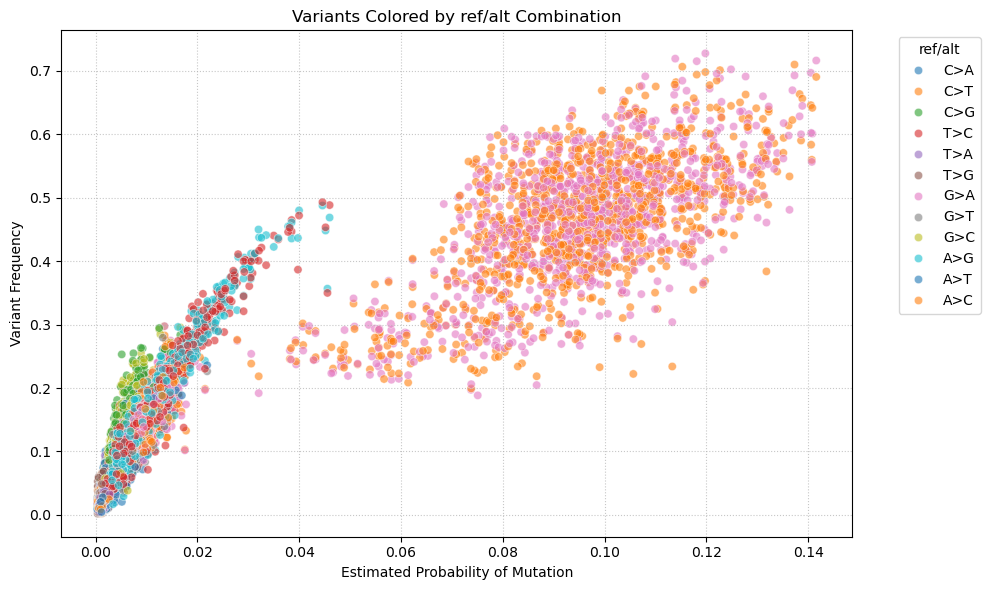

In [23]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=merged, x='estimated_p_mutated', y='var_freq', hue='ref_alt', palette='tab10', alpha=0.6)
plt.title('Variants Colored by ref/alt Combination')
plt.xlabel('Estimated Probability of Mutation')
plt.ylabel('Variant Frequency')
plt.grid(True, linestyle=':', alpha=0.7)
plt.legend(title='ref/alt', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np # Needed for creating a range for the regression line

# Assuming you have already performed the linear regression:
# from sklearn.linear_model import LinearRegression
# X = merged_df[['estimated_p_mutated']]
# y = merged_df['var_freq']
# model = LinearRegression()
# model.fit(X,y)

# 1. Create the scatter plot of the actual data points
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X['estimated_p_mutated'], y=y, hue= 'ref_alt', alpha=0.6, label='Actual Data Points')

# 2. Plot the regression line
# Get the minimum and maximum values of X to draw the line across the range
x_min = X['estimated_p_mutated'].min()
x_max = X['estimated_p_mutated'].max()

# Create a range of X values for prediction (e.g., 100 points between min and max)
x_line = np.linspace(x_min, x_max, 100).reshape(-1, 1)

# Predict y values for these X values using the trained model
y_line = model.predict(x_line)

# Plot the regression line
plt.plot(x_line, y_line, color='red', linestyle='--', linewidth=2, label='Regression Line')

# 3. Add labels and title
plt.title('Linear Regression: Estimated Probability of Mutation vs. Variant Frequency')
plt.xlabel('Estimated Probability of Mutation (estimated_p_mutated)')
plt.ylabel('Variant Frequency (var_freq)')
plt.grid(True, linestyle=':', alpha=0.7)
plt.legend()
plt.tight_layout() # Adjust layout to prevent labels from overlapping
plt.show()

# Optional: Plotting Residuals
# Residuals are the differences between observed and predicted values
# If your model is good, residuals should be randomly distributed around zero.

y_pred = model.predict(X)
residuals = y - y_pred

plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_pred, y=residuals, alpha=0.6)
plt.axhline(y=0, color='red', linestyle='--', linewidth=1) # Line at y=0
plt.title('Residual Plot')
plt.xlabel('Predicted Variant Frequency')
plt.ylabel('Residuals (Actual - Predicted)')
plt.grid(True, linestyle=':', alpha=0.7)
plt.tight_layout()
plt.show()

# You can also get the model's coefficients if you want to display them
print(f"Intercept: {model.intercept_}")
print(f"Coefficient (estimated_p_mutated): {model.coef_[0]}")

ValueError: Could not interpret value `ref_alt` for `hue`. Value is a string, but `data` was not passed.

<Figure size 1000x600 with 0 Axes>

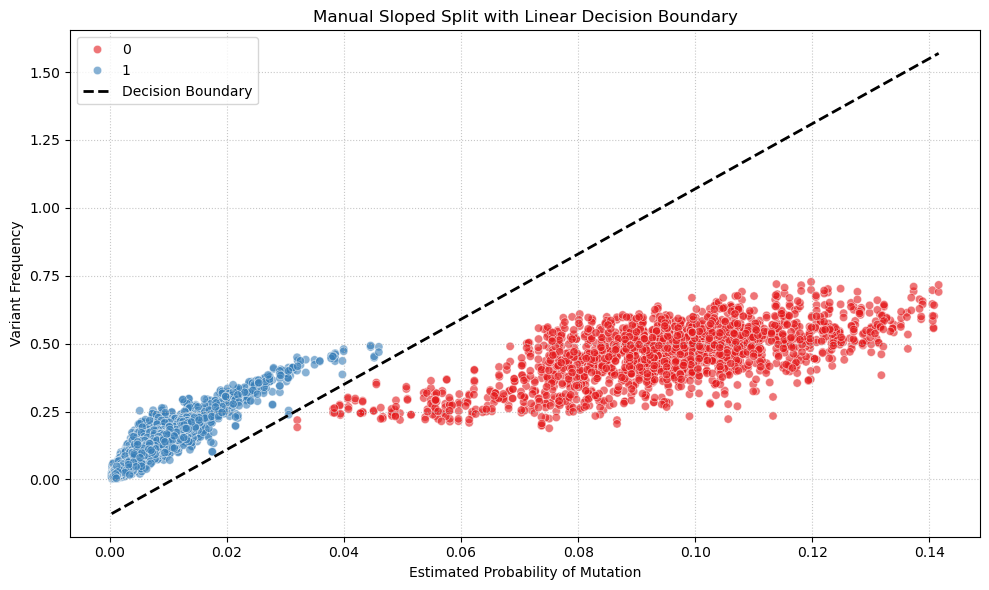

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define your slope and intercept
a = 12  # example slope
b = -0.13  # example intercept

# Compute the decision boundary
boundary = a * merged['estimated_p_mutated'] + b
merged['cluster'] = (merged['var_freq'] > boundary).astype(int)

# Plot the scatter and boundary line
plt.figure(figsize=(10, 6))
sns.scatterplot(data=merged, x='estimated_p_mutated', y='var_freq', hue='cluster', palette='Set1', alpha=0.6)

# Plot the decision boundary line
x_vals = np.linspace(merged['estimated_p_mutated'].min(), merged['estimated_p_mutated'].max(), 100)
y_vals = a * x_vals + b
plt.plot(x_vals, y_vals, color='black', linestyle='--', linewidth=2, label='Decision Boundary')

# Final formatting
plt.title('Manual Sloped Split with Linear Decision Boundary')
plt.xlabel('Estimated Probability of Mutation')
plt.ylabel('Variant Frequency')
plt.grid(True, linestyle=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()


/opt/modules/i12g/anaconda/envs/ml4rg_p7_2/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/opt/modules/i12g/anaconda/envs/ml4rg_p7_2/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/opt/modules/i12g/anaconda/envs/ml4rg_p7_2/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/opt/modules/i12g/anaconda/envs/ml4rg_p7_2/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/opt/modules/i12g/anaconda/envs/ml4rg_p7_2/lib/python3.10/site-packages/sklearn/utils/validation.py:2749

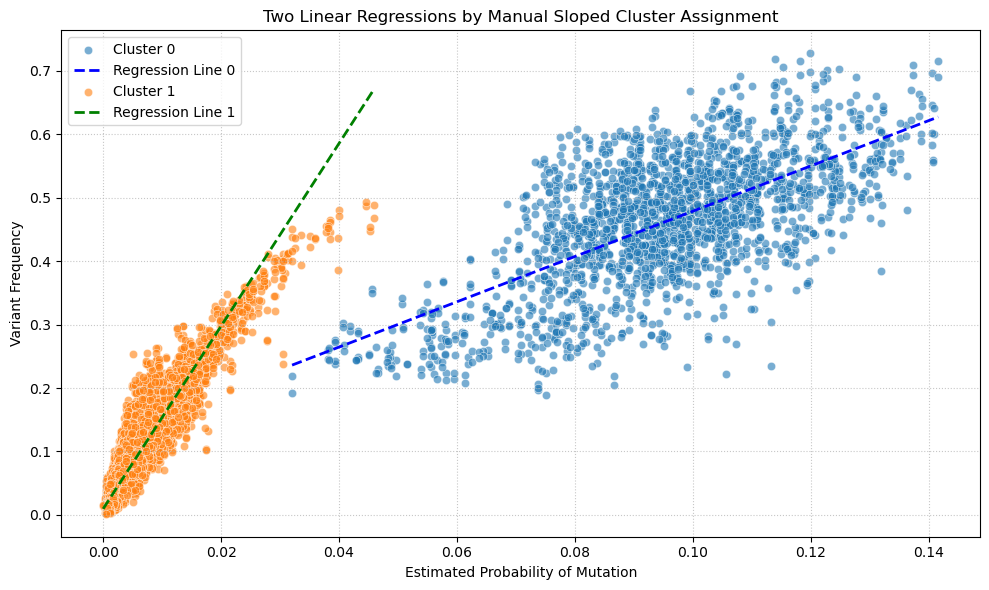

Cluster 0: Intercept = 0.1217, Coefficient = 3.5712
Cluster 1: Intercept = 0.0095, Coefficient = 14.4078


In [23]:
# 3. Fit linear regression models for each cluster
models = {}
colors = ['blue', 'green']
plt.figure(figsize=(10, 6))

for cluster_id in [0, 1]:
    sub_df = merged[merged['cluster'] == cluster_id]
    X = sub_df[['estimated_p_mutated']]
    y = sub_df['var_freq']
    
    model = LinearRegression()
    model.fit(X, y)
    models[cluster_id] = model
    
    # Scatter plot
    sns.scatterplot(x=X['estimated_p_mutated'], y=y, label=f'Cluster {cluster_id}', alpha=0.6)
    
    # Regression line
    x_vals = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)
    y_vals = model.predict(x_vals)
    plt.plot(x_vals, y_vals, linestyle='--', linewidth=2, color=colors[cluster_id], label=f'Regression Line {cluster_id}')

merged["adapted_cluster_reg"] = merged.apply(
    lambda r: models[r["cluster"]].predict([[r["estimated_p_mutated"]]])[0],
    axis=1
)

# 4. Formatting
plt.title('Two Linear Regressions by Manual Sloped Cluster Assignment')
plt.xlabel('Estimated Probability of Mutation')
plt.ylabel('Variant Frequency')
plt.grid(True, linestyle=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

# 6. Print model coefficients
for cluster_id, model in models.items():
    print(f"Cluster {cluster_id}: Intercept = {model.intercept_:.4f}, Coefficient = {model.coef_[0]:.4f}")

In [24]:
print(merged)

       n_var alt sequence_context  n_total  estimated_p_mutated  var_freq ref  \
0         30   A          TATCGAT      354             0.006495  0.084746   C   
1        237   C          CGATGGG     1225             0.013260  0.193469   T   
2        547   A          GATGGGC     3715             0.009415  0.147241   G   
3        407   A          AACGACA      783             0.076666  0.519796   G   
4         92   A          ACATTCC     3709             0.001521  0.024805   T   
...      ...  ..              ...      ...                  ...       ...  ..   
49147      1   G          GCGTATA      270             0.000490  0.003704   T   
49148      2   T          TGTACCG      444             0.001162  0.004505   A   
49149      4   C          ATTACGC      386             0.000595  0.010363   A   
49150      1   C          AGTATCG      381             0.001079  0.002625   A   
49151      1   G          CCGTATC      547             0.000405  0.001828   T   

       cluster  adapted_clu

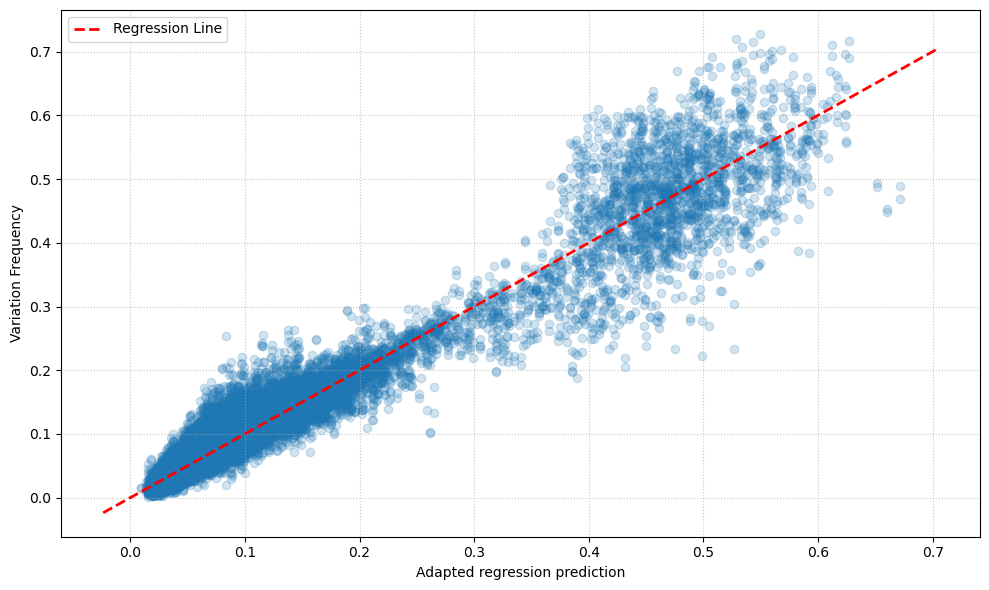

In [26]:
import numpy as np
import matplotlib.pyplot as plt

# --- 1.  SCATTER OF PREDICTION  vs  OBSERVATION -----------------------------
plt.figure(figsize=(10, 6))

# Make sure you pass 1‑D Series, not DataFrames
plt.scatter(
    merged['adapted_cluster_reg'],   # x‑axis = your calibrated prediction
    merged['var_freq'],           # y‑axis = the observed rate
    alpha=0.2
)

# --- 2.  BEST‑FIT (CALIBRATION) LINE USING NUMPY.polyfit ---------------------
m, b = np.polyfit(                   # degree‑1 = straight line
    merged['adapted_cluster_reg'],
    merged['var_freq'],
    1
)

# grab the current axis limits so the line spans the whole plot
x_vals = np.array(plt.gca().get_xlim())
y_vals = m * x_vals + b

plt.plot(x_vals, y_vals, color='red', linestyle='--', linewidth=2,
         label=f'Regression Line')

# --- 3.  A LITTLE POLISH -----------------------------------------------------
plt.xlabel('Adapted regression prediction')
plt.ylabel('Variation Frequency')
plt.grid(True, linestyle=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
merged_df.to_csv("/s/project/ml4rg_students/2025/project07/group_2/data/neutral_model_calibrated.csv")

In [7]:
import pandas as pd
merged = pd.read_csv("/s/project/ml4rg_students/2025/project07/group_2/data/neutral_model_calibrated.csv")

,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,sequence_context,total_count,var_count,var_freq,ref,alt,estimated_p_mutated,cluster,calibrated_cluster_reg
0,0,0,0,TATCGAT,354,30,0.084746,C,A,0.006495,1,0.103080
1,1,1,1,TATCGAT,354,169,0.477401,C,T,0.085112,0,0.425681
2,2,2,2,TATCGAT,354,41,0.115819,C,G,0.004966,1,0.081063
3,3,3,3,CGATGGG,1225,237,0.193469,T,C,0.013260,1,0.200559
4,4,4,4,CGATGGG,1225,62,0.050612,T,A,0.002437,1,0.044619
...,...,...,...,...,...,...,...,...,...,...,...,...
49145,49145,49145,49147,ACGAACG,294,16,0.054422,A,G,0.003210,1,0.055757
49146,49146,49146,49148,ACGAACG,294,6,0.020408,A,T,0.000977,1,0.023583
49147,49147,49147,49149,TCGAACG,238,4,0.016807,A,G,0.003399,1,0.058476
49148,49148,49148,49150,TCGAACG,238,2,0.008403,A,C,0.000944,1,0.023109


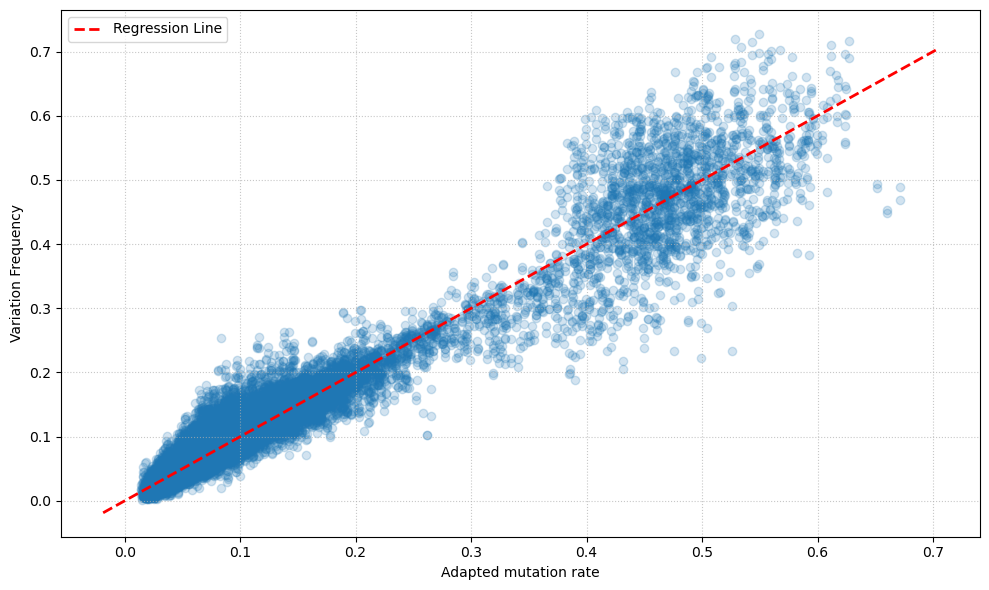

In [9]:
import numpy as np
import matplotlib.pyplot as plt

# --- 1.  SCATTER OF PREDICTION  vs  OBSERVATION -----------------------------
plt.figure(figsize=(10, 6))

# Make sure you pass 1‑D Series, not DataFrames
plt.scatter(
    merged['calibrated_cluster_reg'],   # x‑axis = your calibrated prediction
    merged['var_freq'],           # y‑axis = the observed rate
    alpha=0.2
)

# --- 2.  BEST‑FIT (CALIBRATION) LINE USING NUMPY.polyfit ---------------------
m, b = np.polyfit(                   # degree‑1 = straight line
    merged['calibrated_cluster_reg'],
    merged['var_freq'],
    1
)

# grab the current axis limits so the line spans the whole plot
x_vals = np.array(plt.gca().get_xlim())
y_vals = m * x_vals + b

plt.plot(x_vals, y_vals, color='red', linestyle='--', linewidth=2,
         label=f'Regression Line')

# --- 3.  A LITTLE POLISH -----------------------------------------------------
plt.xlabel('Adapted mutation rate')
plt.ylabel('Variation Frequency')
plt.grid(True, linestyle=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()